In [142]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
from datetime import timedelta
import plotly.express as px
import plotly
import altair as alt
import pickle
import folium
from branca.colormap import linear
from folium.plugins import MarkerCluster
from folium import plugins
import folium.plugins as plugins
from folium.plugins import HeatMapWithTime
from folium import IFrame


# DATA

In [143]:
path_train = "/Users/patrickmacclenihan/Desktop/final_project/DATA/Train.csv"
path_riders = "/Users/patrickmacclenihan/Desktop/final_project/DATA/Riders.csv"
df_train = pd.read_csv(path_train)
df_riders = pd.read_csv(path_riders)
df_speed = pickle.load( open( "/Users/patrickmacclenihan/Desktop/final_project/DATA/UBER/travel_time", "rb" ) )
travel_time = pickle.load( open( "/Users/patrickmacclenihan/Desktop/final_project/DATA/sendy_drivers_travel_time", "rb" ) )
geojson = pickle.load( open( "/Users/patrickmacclenihan/Desktop/final_project/DATA/GEOJSON_for_maps", "rb" ) )
df_for_maps = pickle.load( open( "/Users/patrickmacclenihan/Desktop/final_project/DATA/DataFrame_for_maps", "rb" ) )
time_data = pickle.load( open("/Users/patrickmacclenihan/Desktop/final_project/DATA/timedata_for_maps", "rb" ) )

In [144]:
df= pd.merge(df_train, df_riders , on = "Rider Id")

In [145]:
time_to_convert_in_train = ['Arrival at Pickup - Time',
       'Pickup - Time', 'Arrival at Destination - Time']

for column in time_to_convert_in_train : 
    df[column] = df[column].apply(lambda x : pd.to_datetime(x).strftime('%H:%M:%S'))
    df[column] = pd.to_datetime(df[column], format='%H:%M:%S').dt.time


In [146]:
df['Pickup_Hour'] = df['Pickup - Time'].apply(lambda x : x.hour)

In [147]:
df["Speed_in_km/h"] = df["Distance (KM)"] / df['Time from Pickup to Arrival']*3600 

In [148]:
def is_week_end(x): 
    if x > 5 : 
        return 1
    else :
        return 0
    
df["Week_end"] = df["Placement - Weekday (Mo = 1)"].apply(is_week_end)

In [149]:
small_speed_df = pd.DataFrame(df_speed.groupby(["sourceid","hod"])["mean_travel_time"].mean()).reset_index()

## Over Speed

In [150]:
def error_detection(x) : 
    if x > 50 or x < 5: 
        return "Yes"
    else : 
        return "No"
df["Overspeed"] = df["Speed_in_km/h"].apply(lambda x : error_detection(x))

# Graph

## 1er Graph

In [151]:
deliveries_count = df.groupby(["Placement - Weekday (Mo = 1)","Personal or Business", "Pickup_Hour"]).agg({"Personal or Business": ['count']})
deliveries_count.columns = ['nb_deliveries']
deliveries_count = deliveries_count.reset_index()
deliveries_count = deliveries_count.groupby(["Placement - Weekday (Mo = 1)", 'Personal or Business'])["nb_deliveries"].sum().reset_index()

In [152]:
fig = px.bar(deliveries_count, x="Placement - Weekday (Mo = 1)", 
             y="nb_deliveries", color='Personal or Business'
             , color_discrete_sequence=px.colors.qualitative.Pastel1 )

fig.layout.plot_bgcolor = '#F1F1F1'
fig.layout.paper_bgcolor = '#F1F1F1'

fig.show()

In [153]:
# brush = alt.selection_interval()

# alt.Chart(deliveries_count, width=600,
#     height=200).mark_bar(opacity=0.7).encode(
#     x='Placement - Weekday (Mo = 1):O',
#     y=alt.Y('nb_deliveries:Q', stack=None),
#     color="Personal or Business",
# ).add_selection(brush)





## 2nd Graph

In [154]:

deliveries_per_hour = df.groupby(["Placement - Weekday (Mo = 1)", "Pickup_Hour"]).agg({"Personal or Business": ['count']})
deliveries_per_hour.columns = ['nb_deliveries']
deliveries_per_hour= deliveries_per_hour.reset_index()


hourly_delivery = px.bar( deliveries_per_hour,
             x='Pickup_Hour', 
             y= "nb_deliveries",
             color = "Placement - Weekday (Mo = 1)",
            range_x = [6,23],
            title= "Hourly Pickups",
            color_discrete_sequence= px.colors.qualitative.Dark2 )



hourly_delivery.layout.plot_bgcolor = '#F1F1F1'
hourly_delivery.layout.paper_bgcolor = '#F1F1F1' 

hourly_delivery.show()


## Speed Graphs 

In [155]:
small_speed_df["mean_travel_time"] = small_speed_df["mean_travel_time"] / 60

In [156]:
# uber_speed_per_hour_small = px.scatter( 
#     small_speed_df,
#     x= 'hod', 
#     y= "mean_travel_time",
#     color = "hod",
#     title= "Speed in Nairobi (Uber Source)")
# uber_speed_per_hour_small.show()

In [157]:
df_speed2 = df_speed.groupby(["sourceid","dstid", "week_end_or_not"])["mean_travel_time"].mean().reset_index()

In [158]:
px.scatter( 
    df_speed2,
    x= 'sourceid', 
    y= "mean_travel_time", 
color = 'week_end_or_not' )

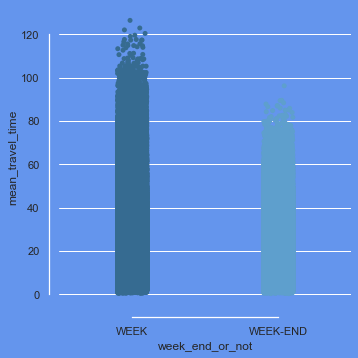

In [159]:
df_speed["mean_travel_time"]   = df_speed["mean_travel_time"]  / 60
speed_week_end_or_not = sns.catplot( x= 'week_end_or_not', y= "mean_travel_time" , data = df_speed , 
                                   palette = "Blues_d"                                  
                                   )
sns.despine(offset=10, trim=True)

speed_week_end_or_not.set_xticklabels(["WEEK" , "WEEK-END"])
speed_week_end_or_not

In [160]:
grouped_multiple = df[df["Speed_in_km/h"] < 50].groupby(['Week_end', 'Pickup_Hour']).agg({'Speed_in_km/h': ['mean']})
grouped_multiple.columns = ['speed_mean']
grouped_multiple = grouped_multiple.reset_index()

sendy_drivers_speed = px.line( grouped_multiple , x='Pickup_Hour', y='speed_mean', color='Week_end')
sendy_drivers_speed.update_layout(title='Hourly speed average on Sendy drivers')
sendy_drivers_speed.show()

## Outliers Graph

In [161]:

travel_time_outliers = px.scatter(travel_time, x="PickupTime", y="Travel Time", color="Overspeed", 
                                  title= "Outliers detector"
                                 , color_discrete_sequence=px.colors.qualitative.Safe )

travel_time_outliers.show()

## Maps 

### Clusters

In [162]:
NAIROBI =(-1.2920659,36.8219462)
cluster_map = folium.Map(location=NAIROBI, tiles='cartodbpositron')

#adding marker and popup of city and crime-name
marker_cluster = plugins.MarkerCluster().add_to(cluster_map)

for i in range(0,len(df_train['Destination Lat'])):
    folium.Marker(
        [
            float(df_train['Destination Lat'][i])  ,
                   
float(df_train['Destination Long'][i])
      
      ]
     ).add_to(marker_cluster)
      
        
        
        
        
      #,popup="city name ="+city[i]+"\n crime_of_city = "+crime_name[i]).add_to(marker_cluster)
#we can change tiles with help of LayerConrol

folium.LayerControl().add_to(cluster_map)




In [163]:
cluster_map_html  = cluster_map
cluster_map_html.save("Cluster_Map.html")


### Time Map

In [164]:
map_with_time = folium.Map(location=NAIROBI, 
                 zoom_start=10, min_zoom = 10 , tiles= 'Stamen Toner')

hm = HeatMapWithTime(data=time_data, auto_play=True)
hm.add_to(map_with_time)
# Display map
map_with_time

map_with_time_html  = map_with_time
map_with_time_html.save("map_with_time.html")
map_with_time

### Uber Areas Map 

In [103]:
uber_areas = folium.Map(location=NAIROBI, zoom_start=12, tiles= 'Stamen Toner')
## add chloropleth layer
folium.Choropleth(
    geo_data=geojson,
    name='PickUp per Areas',
    data=df_for_maps,
    columns=['DISPLAY_NAME', 'Count_PickUp'],
    fill_color='OrRd',
    fill_opacity=0.8,
    line_color='lightcoral',
    line_opacity=2,
    key_on='feature.geometry.name',
    legend_name='Qty of pickups'
).add_to(uber_areas)

folium.Choropleth(
    geo_data=geojson,
    name='Destination per Areas',
    data=df_for_maps,
    columns=['DISPLAY_NAME', 'Count_Destination'],
    fill_color='PuBu',
    fill_opacity=0.8,
    line_color='lightcoral',
    line_opacity=2,
    key_on='feature.geometry.name',
    legend_name='Qty of deliveries'
).add_to(uber_areas)

df_for_maps["geometry lat"] = df_for_maps["geometry"].centroid.x
df_for_maps["geometry long"] = df_for_maps["geometry"].centroid.y

# add markers with basic information
fg = folium.FeatureGroup(name='Info')
for lon, lat, val,val2, name in zip(df_for_maps["geometry long"].tolist(),
                               df_for_maps["geometry lat"].tolist(),
                               df_for_maps['Count_PickUp'].tolist(),
                               df_for_maps['Count_Destination'].tolist(),
                               df_for_maps['DISPLAY_NAME'].tolist() ):
    html = f"""
    <h2>{name}<\h2><br>
    <h4>Number of pick-ups: {int(round(val,0))}  <\h4>
    <h4>Number of deliveries: {int(round(val2,0))}  <\h4>
    """
    fg.add_child(folium.Marker(location=[lat, lon], popup=html))

uber_areas.add_child(fg)

# enable layers to be turned in or out
folium.LayerControl().add_to(uber_areas)
uber_areas

In [105]:
uber_cluster_map_html  = uber_areas
uber_areas.save("../DATA/uber_cluster_map.html")

## Cluster Map

In [27]:
clusters = pickle.load( open("/Users/patrickmacclenihan/Desktop/final_project/DATA/clustersLatLong", "rb"))

In [28]:
clusters

,Pickup Long,Pickup Lat,Destination Lat,Destination Long,pickup_clusters,destination_clusters
0,36.830370,-1.317755,-1.300406,36.829741,7,13
1,36.787807,-1.326774,-1.356237,36.904295,13,10
2,36.782203,-1.255189,-1.273412,36.818206,11,1
3,36.757377,-1.290315,-1.223520,36.802061,5,3
4,36.799220,-1.273524,-1.300431,36.752427,1,0
...,...,...,...,...,...,...
19688,36.812624,-1.265003,-1.265432,36.795034,1,5
19689,36.825741,-1.269609,-1.278067,36.783487,0,11
19690,36.789526,-1.250823,-1.285850,36.830629,11,1
19691,36.787267,-1.291787,-1.298575,36.808800,13,1


In [165]:

base_map= folium.Map(location= NAIROBI, min_zoom = 9,
                      zoom_start=11, tiles= 'Stamen Toner')

cluster1 = folium.FeatureGroup(name='Cluster 1')
cluster2= folium.FeatureGroup(name='Cluster 2')
cluster3= folium.FeatureGroup(name='Cluster 3')
cluster4= folium.FeatureGroup(name='Cluster 4')
cluster5 = folium.FeatureGroup(name='Cluster 5')
cluster6 = folium.FeatureGroup(name='Cluster 6')
cluster7 = folium.FeatureGroup(name='Cluster 7')
cluster8 = folium.FeatureGroup(name='Cluster 8')
cluster9 = folium.FeatureGroup(name='Cluster 9')
cluster10 = folium.FeatureGroup(name='Cluster 10')
cluster11 = folium.FeatureGroup(name='Cluster 11')
cluster12 = folium.FeatureGroup(name='Cluster 12')
cluster13 = folium.FeatureGroup(name='Cluster 13')
cluster14 = folium.FeatureGroup(name='Cluster 14')


#f4fbc1ff
#e5f5b2ff
#cdecb4ff

#7accbcff
#54bdc1ff
#36abc3ff

#1f75b3ff
#2257a5ff
#243d99ff
#192b7dff



for i,v in clusters.iterrows(): 
    if v["pickup_clusters"]  == 0 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color="#081d58ff",
                            fill_color="#081d58ff",
                            fill=True).add_to(cluster1)
        
    if v["pickup_clusters"]  == 1 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#1f94c1ff',
                            fill_color='#1f94c1ff',
                            fill=True).add_to(cluster2)       
        
    if v["pickup_clusters"]  == 2 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#fdc9c5ff',
                            fill_color='#fdc9c5ff',
                            fill=True).add_to(cluster3)
        
    if v["pickup_clusters"]  == 3 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#dab871ff',
                            fill_color='#dab871ff',
                            fill=True).add_to(cluster4)       
        
    if v["pickup_clusters"]  == 4 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#b5e3d9ff',
                            fill_color='#b5e3d9ff',
                            fill=True).add_to(cluster5)
        
    if v["pickup_clusters"]  == 5 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#a6017dff',
                            fill_color='#a6017dff',
                            fill=True).add_to(cluster6)       
        
    if v["pickup_clusters"]  == 6 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#5abc96ff',
                            fill_color='#5abc96ff',
                            fill=True).add_to(cluster7)
        
    if v["pickup_clusters"]  == 7 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#ac6e1fff',
                            fill_color='#ac6e1fff',
                            fill=True).add_to(cluster8)       
        
    if v["pickup_clusters"]  == 8 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#49006aff',
                            fill_color='#49006aff',
                            fill=True).add_to(cluster9)
        
    if v["pickup_clusters"]  == 9 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#44b07aff',
                            fill_color='#44b07aff',
                            fill=True).add_to(cluster10)       

                
    if v["pickup_clusters"]  == 10 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color="#243d99ff",
                            fill_color="#243d99ff",
                            fill=True).add_to(cluster11) 
        
    if v["pickup_clusters"]  == 11 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#087431ff',
                            fill_color='#087431ff',
                            fill=True).add_to(cluster12) 
        
    if v["pickup_clusters"]  == 12 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color="#005d25ff",
                            fill_color="#005d25ff",
                            fill=True).add_to(cluster13) 
        
    if v["pickup_clusters"]  == 13 : 
        folium.CircleMarker(location=[v['Pickup Lat'], v['Pickup Long']],
                            radius=1,
                            tooltip=None,
                            color='#00441bff',
                            fill_color='#00441bff',
                            fill=True).add_to(cluster14)         

cluster1.add_to(base_map)
cluster2.add_to(base_map)
cluster3.add_to(base_map)
cluster4.add_to(base_map)
cluster5.add_to(base_map)
cluster6.add_to(base_map)
cluster7.add_to(base_map)
cluster8.add_to(base_map)
cluster9.add_to(base_map)
cluster10.add_to(base_map)
cluster11.add_to(base_map)
cluster12.add_to(base_map) 
cluster13.add_to(base_map)
cluster14.add_to(base_map) 


folium.LayerControl(collapsed=False).add_to(base_map)
7

7

In [166]:
base_map

In [167]:
cluster_map_html  = base_map
cluster_map_html.save("14_cluster_map.html")

In [74]:
nbh_count_colormap = linear.BrBG_09.scale((0),
                                            (130))

In [75]:
nbh_count_colormap

In [76]:
for i in range(10,140,10) : 
    print(nbh_count_colormap(i))

#ac6e1fff
#c7903fff
#dab871ff
#ead49dff
#f6e9c7ff
#f6f1e6ff
#e7f2f1ff
#cbebe7ff
#a1dbd2ff
#74c5baff
#46a49bff
#21847cff
#01665eff


In [39]:
style_function = lambda x: {
    'fillColor': nbh_count_colormap(x) }

In [42]:
style_function()

{'fillColor': '#f4fbc1ff'}